In [1]:
#1B
import sqlite3
import json
import time
import requests
from requests.exceptions import ChunkedEncodingError

url = "http://dbgroup.cdm.depaul.edu/DSC450/OneDayOfTweets.txt"
conn = sqlite3.connect('tweet_Final_550000_3.db')
cursor = conn.cursor()

cursor.execute("DROP TABLE IF EXISTS Tweets")
cursor.execute("DROP TABLE IF EXISTS User")
cursor.execute("DROP TABLE IF EXISTS Geo")

cursor.execute('''CREATE TABLE IF NOT EXISTS User (
                    user_id INTEGER PRIMARY KEY,
                    id INTEGER,
                    name VARCHAR(250),
                    screen_name VARCHAR(250),
                    description VARCHAR(300),
                    friends_count INTEGER
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Geo (
                    longitude REAL,
                    latitude REAL,
                    type VARCHAR(50),
                    PRIMARY KEY (longitude, latitude)
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Tweets (
                    created_at VARCHAR(50),
                    id_str INTEGER,
                    text VARCHAR(300),
                    source VARCHAR(100),
                    in_reply_to_user_id INTEGER,
                    in_reply_to_screen_name VARCHAR(150),
                    in_reply_to_status_id INTEGER,
                    retweet_count INTEGER,
                    contributors VARCHAR(100),
                    user_id INTEGER,
                    longitude REAL,
                    latitude REAL,
                    FOREIGN KEY (user_id) REFERENCES User (user_id),
                    FOREIGN KEY (longitude, latitude) REFERENCES Geo (longitude, latitude)
                )''')

tweet_limit = 550000
tweet_counter = 0

start = time.time()

try:
    response = requests.get(url, stream=True)
    lines = response.iter_lines()

    error_tweets = []
    geo_dict = {}

    for line in lines:
        if tweet_counter >= tweet_limit:
            break

        try:
            decoded_line = line.decode('utf-8')
            tweet_dict = json.loads(decoded_line)

            user_id = tweet_dict['user']['id']
            name = tweet_dict['user']['name']
            screen_name = tweet_dict['user']['screen_name']
            description = tweet_dict['user']['description']
            friends_count = tweet_dict['user']['friends_count']

            cursor.execute('''INSERT INTO User (id, name, screen_name, description, friends_count)
                            VALUES (?, ?, ?, ?, ?)''',
                           (user_id, name, screen_name, description, friends_count))
            user_row_id = cursor.lastrowid

            created_at = tweet_dict['created_at']
            id_str = tweet_dict['id_str']
            text = tweet_dict['text']
            source = tweet_dict['source']
            in_reply_to_user_id = tweet_dict['in_reply_to_user_id']
            in_reply_to_screen_name = tweet_dict['in_reply_to_screen_name']
            in_reply_to_status_id = tweet_dict['in_reply_to_status_id']
            retweet_count = tweet_dict['retweet_count']
            contributors = tweet_dict['contributors']

            geo_data = tweet_dict.get('geo')
            if geo_data is not None:
                geo_type = geo_data['type']
                longitude, latitude = geo_data['coordinates']
            else:
                geo_type = None
                longitude = None
                latitude = None

            if longitude is not None and latitude is not None:
                geo_key = f'{longitude}_{latitude}'
                if geo_key in geo_dict:
                    geo_id = geo_dict[geo_key]
                else:
                    cursor.execute('''INSERT INTO Geo (longitude, latitude, type)
                                   VALUES (?, ?, ?)''',
                                   (longitude, latitude, geo_type))
                    geo_id = (longitude, latitude)
                    geo_dict[geo_key] = geo_id
            else:
                geo_id = None

            cursor.execute('''INSERT INTO Tweets (created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name, in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude)
                            VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)''',
                           (created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name, in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude))
            conn.commit()

            tweet_counter += 1

        except Exception as e:
            error_tweets.append(line)
            print(f"Error: {e}")

    print("User Table")
    cursor.execute('SELECT COUNT(*) FROM User')
    user_count = cursor.fetchone()[0]
    print("number of rows in User Table:", user_count)

    print("Tweets Table")
    cursor.execute('SELECT COUNT(*) FROM Tweets')
    tweet_count = cursor.fetchone()[0]
    print("number of rows in Tweets Table:", tweet_count)

    print("Geo Table")
    cursor.execute('SELECT COUNT(*) FROM Geo')
    geo_count = cursor.fetchone()[0]
    print("number rows in Geo Table:", geo_count)

    end = time.time()
    time_taken = end - start

    print(f"Time taken for {tweet_limit} tweets: {time_taken} seconds")

except ChunkedEncodingError as ce:
    print(f"Chunked Encoding Error: {ce}")

conn.close()


User Table
number of rows in User Table: 550000
Tweets Table
number of rows in Tweets Table: 550000
Geo Table
number rows in Geo Table: 13103
Time taken for 550000 tweets: 1268.6021401882172 seconds


In [2]:

import sqlite3
import json
import time
import requests
from requests.exceptions import ChunkedEncodingError

url = "http://dbgroup.cdm.depaul.edu/DSC450/OneDayOfTweets.txt"
conn = sqlite3.connect('tweet_Final_110000_1.db')
cursor = conn.cursor()

cursor.execute("DROP TABLE IF EXISTS Tweets")
cursor.execute("DROP TABLE IF EXISTS User")
cursor.execute("DROP TABLE IF EXISTS Geo")

cursor.execute('''CREATE TABLE IF NOT EXISTS User (
                    user_id INTEGER PRIMARY KEY,
                    id INTEGER,
                    name VARCHAR(250),
                    screen_name VARCHAR(250),
                    description VARCHAR(300),
                    friends_count INTEGER
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Geo (
                    longitude REAL,
                    latitude REAL,
                    type VARCHAR(50),
                    PRIMARY KEY (longitude, latitude)
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Tweets (
                    created_at VARCHAR(50),
                    id_str INTEGER,
                    text VARCHAR(300),
                    source VARCHAR(100),
                    in_reply_to_user_id INTEGER,
                    in_reply_to_screen_name VARCHAR(150),
                    in_reply_to_status_id INTEGER,
                    retweet_count INTEGER,
                    contributors VARCHAR(100),
                    user_id INTEGER,
                    longitude REAL,
                    latitude REAL,
                    FOREIGN KEY (user_id) REFERENCES User (user_id),
                    FOREIGN KEY (longitude, latitude) REFERENCES Geo (longitude, latitude)
                )''')

tweet_limit = 110000
tweet_counter = 0

start = time.time()

try:
    response = requests.get(url, stream=True)
    lines = response.iter_lines()

    error_tweets = []
    geo_dict = {}

    for line in lines:
        if tweet_counter >= tweet_limit:
            break

        try:
            decoded_line = line.decode('utf-8')
            tweet_dict = json.loads(decoded_line)

            user_id = tweet_dict['user']['id']
            name = tweet_dict['user']['name']
            screen_name = tweet_dict['user']['screen_name']
            description = tweet_dict['user']['description']
            friends_count = tweet_dict['user']['friends_count']

            cursor.execute('''INSERT INTO User (id, name, screen_name, description, friends_count)
                            VALUES (?, ?, ?, ?, ?)''',
                           (user_id, name, screen_name, description, friends_count))
            user_row_id = cursor.lastrowid

            created_at = tweet_dict['created_at']
            id_str = tweet_dict['id_str']
            text = tweet_dict['text']
            source = tweet_dict['source']
            in_reply_to_user_id = tweet_dict['in_reply_to_user_id']
            in_reply_to_screen_name = tweet_dict['in_reply_to_screen_name']
            in_reply_to_status_id = tweet_dict['in_reply_to_status_id']
            retweet_count = tweet_dict['retweet_count']
            contributors = tweet_dict['contributors']

            geo_data = tweet_dict.get('geo')
            if geo_data is not None:
                geo_type = geo_data['type']
                longitude, latitude = geo_data['coordinates']
            else:
                geo_type = None
                longitude = None
                latitude = None

            if longitude is not None and latitude is not None:
                geo_key = f'{longitude}_{latitude}'
                if geo_key in geo_dict:
                    geo_id = geo_dict[geo_key]
                else:
                    cursor.execute('''INSERT INTO Geo (longitude, latitude, type)
                                   VALUES (?, ?, ?)''',
                                   (longitude, latitude, geo_type))
                    geo_id = (longitude, latitude)
                    geo_dict[geo_key] = geo_id
            else:
                geo_id = None

            cursor.execute('''INSERT INTO Tweets (created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name, in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude)
                            VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)''',
                           (created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name, in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude))
            conn.commit()

            tweet_counter += 1

        except Exception as e:
            error_tweets.append(line)
            print(f"Error: {e}")

    print("User Table")
    cursor.execute('SELECT COUNT(*) FROM User')
    user_count = cursor.fetchone()[0]
    print("number of rows in User Table:", user_count)

    print("Tweets Table")
    cursor.execute('SELECT COUNT(*) FROM Tweets')
    tweet_count = cursor.fetchone()[0]
    print("number of rows in Tweets Table:", tweet_count)

    print("Geo Table")
    cursor.execute('SELECT COUNT(*) FROM Geo')
    geo_count = cursor.fetchone()[0]
    print("number rows in Geo Table:", geo_count)

    end = time.time()
    time_taken = end - start

    print(f"Time taken for {tweet_limit} tweets: {time_taken} seconds")

except ChunkedEncodingError as ce:
    print(f"Chunked Encoding Error: {ce}")

conn.close()


User Table
number of rows in User Table: 110000
Tweets Table
number of rows in Tweets Table: 110000
Geo Table
number rows in Geo Table: 2454
Time taken for 110000 tweets: 238.99557852745056 seconds


In [3]:
#1A
import urllib.request
import time

def write_tweets(tweets_limit):
    url = "http://dbgroup.cdm.depaul.edu/DSC450/OneDayOfTweets.txt"
    OP_File = f"tweets_{tweets_limit}.txt"

    start = time.time()
    count = 0

    with urllib.request.urlopen(url) as tweet_response:
            with open(OP_File, "w", encoding="utf-8") as file:
                for line in tweet_response:
                    file.write(line.decode().strip() + "\n")
                    count += 1

                    if count >= tweets_limit:
                        break

    end = time.time()
    time_taken = end - start

    print(f"File ({tweets_limit}) created successfully.")
    return time_taken

In [5]:
# tweets_limit = 110,000 tweets
A1_110000 = write_tweets(110000)
print("Time taken for 110000 tweets", A1_110000, "seconds")

File (110000) created successfully.
Time taken for 110000 tweets 6.811869859695435 seconds


In [6]:
# tweets_limit = 550,000 tweets
A1_550000 = write_tweets(550000)
print("Time taken for 550000 tweets", A1_550000, "seconds")

File (550000) created successfully.
Time taken for 550000 tweets 31.154720544815063 seconds


In [1]:
#1C
import sqlite3
import json
import time

file_path = "C:/Users/nachi/Desktop/Databases/Final_BD/tweets_550000.txt" 
conn = sqlite3.connect('tweet_1C_550000.db')
cursor = conn.cursor()

cursor.execute("DROP TABLE IF EXISTS Tweets")
cursor.execute("DROP TABLE IF EXISTS User")
cursor.execute("DROP TABLE IF EXISTS Geo")

cursor.execute('''CREATE TABLE IF NOT EXISTS User (
                    user_id INTEGER PRIMARY KEY,
                    id INTEGER,
                    name VARCHAR(250),
                    screen_name VARCHAR(250),
                    description VARCHAR(300),
                    friends_count INTEGER
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Geo (
                    longitude REAL,
                    latitude REAL,
                    type VARCHAR(50),
                    PRIMARY KEY (longitude, latitude)
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Tweets (
                    created_at VARCHAR(50),
                    id_str INTEGER,
                    text VARCHAR(300),
                    source VARCHAR(100),
                    in_reply_to_user_id INTEGER,
                    in_reply_to_screen_name VARCHAR(150),
                    in_reply_to_status_id INTEGER,
                    retweet_count INTEGER,
                    contributors VARCHAR(100),
                    user_id INTEGER,
                    longitude REAL,
                    latitude REAL,
                    FOREIGN KEY (user_id) REFERENCES User (user_id),
                    FOREIGN KEY (longitude, latitude) REFERENCES Geo (longitude, latitude)
                )''')

start = time.time()

with open(file_path, "r", encoding="utf-8") as file:
    error_tweets = []
    geo_dict = {}

    for line in file:
        try:
            tweet_dict = json.loads(line)

            user_id = tweet_dict['user']['id']
            name = tweet_dict['user']['name']
            screen_name = tweet_dict['user']['screen_name']
            description = tweet_dict['user']['description']
            friends_count = tweet_dict['user']['friends_count']

            cursor.execute('''INSERT INTO User (id, name, screen_name, description, friends_count)
                            VALUES (?, ?, ?, ?, ?)''',
                           (user_id, name, screen_name, description, friends_count))
            user_row_id = cursor.lastrowid

            created_at = tweet_dict['created_at']
            id_str = tweet_dict['id_str']
            text = tweet_dict['text']
            source = tweet_dict['source']
            in_reply_to_user_id = tweet_dict['in_reply_to_user_id']
            in_reply_to_screen_name = tweet_dict['in_reply_to_screen_name']
            in_reply_to_status_id = tweet_dict['in_reply_to_status_id']
            retweet_count = tweet_dict['retweet_count']
            contributors = tweet_dict['contributors']

            geo_data = tweet_dict.get('geo')
            if geo_data is not None:
                geo_type = geo_data['type']
                longitude, latitude = geo_data['coordinates']
            else:
                geo_type = None
                longitude = None
                latitude = None

            if longitude is not None and latitude is not None:
                geo_key = f'{longitude}_{latitude}'
                if geo_key in geo_dict:
                    geo_id = geo_dict[geo_key]
                else:
                    cursor.execute('''INSERT INTO Geo (longitude, latitude, type)
                                   VALUES (?, ?, ?)''',
                                   (longitude, latitude, geo_type))
                    geo_id = (longitude, latitude)
                    geo_dict[geo_key] = geo_id
            else:
                geo_id = None

            cursor.execute('''INSERT INTO Tweets (created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name, in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude)
                            VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)''',
                           (created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name, in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude))
            conn.commit()

        except Exception as e:
            error_tweets.append(line)
            print(f"Error: {e}")

print("User Table")
cursor.execute('SELECT COUNT(*) FROM User')
user_count = cursor.fetchone()[0]
print("number of rows in User Table:", user_count)

print("Tweets Table")
cursor.execute('SELECT COUNT(*) FROM Tweets')
tweet_count = cursor.fetchone()[0]
print("number of rows in Tweets Table:", tweet_count)

print("Geo Table")
cursor.execute('SELECT COUNT(*) FROM Geo')
geo_count = cursor.fetchone()[0]
print("number rows in Geo Table:", geo_count)

end = time.time()
execution_time = end - start

print(f"Time taken for 550000: {execution_time} seconds")

conn.close()
               


User Table
number of rows in User Table: 550000
Tweets Table
number of rows in Tweets Table: 550000
Geo Table
number rows in Geo Table: 13103
Time taken for 550000: 1396.0232889652252 seconds


In [9]:
#1C 110000
import sqlite3
import json
import time

file_path = "C:/Users/nachi/Desktop/Databases/Final_BD/tweets_110000.txt" 
conn = sqlite3.connect('tweet_1C_110000.db')
cursor = conn.cursor()

cursor.execute("DROP TABLE IF EXISTS Tweets")
cursor.execute("DROP TABLE IF EXISTS User")
cursor.execute("DROP TABLE IF EXISTS Geo")

cursor.execute('''CREATE TABLE IF NOT EXISTS User (
                    user_id INTEGER PRIMARY KEY,
                    id INTEGER,
                    name VARCHAR(250),
                    screen_name VARCHAR(250),
                    description VARCHAR(300),
                    friends_count INTEGER
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Geo (
                    longitude REAL,
                    latitude REAL,
                    type VARCHAR(50),
                    PRIMARY KEY (longitude, latitude)
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Tweets (
                    created_at VARCHAR(50),
                    id_str INTEGER,
                    text VARCHAR(300),
                    source VARCHAR(100),
                    in_reply_to_user_id INTEGER,
                    in_reply_to_screen_name VARCHAR(150),
                    in_reply_to_status_id INTEGER,
                    retweet_count INTEGER,
                    contributors VARCHAR(100),
                    user_id INTEGER,
                    longitude REAL,
                    latitude REAL,
                    FOREIGN KEY (user_id) REFERENCES User (user_id),
                    FOREIGN KEY (longitude, latitude) REFERENCES Geo (longitude, latitude)
                )''')

start = time.time()

with open(file_path, "r", encoding="utf-8") as file:
    error_tweets = []
    geo_dict = {}

    for line in file:
        try:
            tweet_dict = json.loads(line)

            user_id = tweet_dict['user']['id']
            name = tweet_dict['user']['name']
            screen_name = tweet_dict['user']['screen_name']
            description = tweet_dict['user']['description']
            friends_count = tweet_dict['user']['friends_count']

            cursor.execute('''INSERT INTO User (id, name, screen_name, description, friends_count)
                            VALUES (?, ?, ?, ?, ?)''',
                           (user_id, name, screen_name, description, friends_count))
            user_row_id = cursor.lastrowid

            created_at = tweet_dict['created_at']
            id_str = tweet_dict['id_str']
            text = tweet_dict['text']
            source = tweet_dict['source']
            in_reply_to_user_id = tweet_dict['in_reply_to_user_id']
            in_reply_to_screen_name = tweet_dict['in_reply_to_screen_name']
            in_reply_to_status_id = tweet_dict['in_reply_to_status_id']
            retweet_count = tweet_dict['retweet_count']
            contributors = tweet_dict['contributors']

            geo_data = tweet_dict.get('geo')
            if geo_data is not None:
                geo_type = geo_data['type']
                longitude, latitude = geo_data['coordinates']
            else:
                geo_type = None
                longitude = None
                latitude = None

            if longitude is not None and latitude is not None:
                geo_key = f'{longitude}_{latitude}'
                if geo_key in geo_dict:
                    geo_id = geo_dict[geo_key]
                else:
                    cursor.execute('''INSERT INTO Geo (longitude, latitude, type)
                                   VALUES (?, ?, ?)''',
                                   (longitude, latitude, geo_type))
                    geo_id = (longitude, latitude)
                    geo_dict[geo_key] = geo_id
            else:
                geo_id = None

            cursor.execute('''INSERT INTO Tweets (created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name, in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude)
                            VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)''',
                           (created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name, in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude))
            conn.commit()

        except Exception as e:
            error_tweets.append(line)
            print(f"Error: {e}")

print("User Table")
cursor.execute('SELECT COUNT(*) FROM User')
user_count = cursor.fetchone()[0]
print("number of rows in User Table:", user_count)

print("Tweets Table")
cursor.execute('SELECT COUNT(*) FROM Tweets')
tweet_count = cursor.fetchone()[0]
print("number of rows in Tweets Table:", tweet_count)

print("Geo Table")
cursor.execute('SELECT COUNT(*) FROM Geo')
geo_count = cursor.fetchone()[0]
print("number rows in Geo Table:", geo_count)

end = time.time()
execution_time = end - start

print(f"Time taken for 110000: {execution_time} seconds")

conn.close()

User Table
number of rows in User Table: 110000
Tweets Table
number of rows in Tweets Table: 110000
Geo Table
number rows in Geo Table: 2454
Time taken for 110000: 239.9575173854828 seconds


In [13]:
#1D 110000 TWEETS
import sqlite3
import json
import time

file_path = "C:/Users/nachi/Desktop/Databases/Final_BD/tweets_110000.txt"  
conn = sqlite3.connect('tweet_1D_110000.db')
cursor = conn.cursor()

cursor.execute("DROP TABLE IF EXISTS Tweets")
cursor.execute("DROP TABLE IF EXISTS User")
cursor.execute("DROP TABLE IF EXISTS Geo")

cursor.execute('''CREATE TABLE IF NOT EXISTS User (
                    user_id INTEGER PRIMARY KEY,
                    id INTEGER,
                    name VARCHAR(250),
                    screen_name VARCHAR(250),
                    description VARCHAR(300),
                    friends_count INTEGER
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Geo (
                    longitude REAL,
                    latitude REAL,
                    type VARCHAR(50),
                    PRIMARY KEY (longitude, latitude)
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Tweets (
                    created_at VARCHAR(50),
                    id_str INTEGER,
                    text VARCHAR(300),
                    source VARCHAR(100),
                    in_reply_to_user_id INTEGER,
                    in_reply_to_screen_name VARCHAR(150),
                    in_reply_to_status_id INTEGER,
                    retweet_count INTEGER,
                    contributors VARCHAR(100),
                    user_id INTEGER,
                    longitude REAL,
                    latitude REAL,
                    FOREIGN KEY (user_id) REFERENCES User (user_id),
                    FOREIGN KEY (longitude, latitude) REFERENCES Geo (longitude, latitude)
                )''')

start = time.time()

with open(file_path, "r", encoding="utf-8") as file:
    error_tweets = []
    geo_dict = {}
    set_batch = 2000
    tweet_batch = []
    geo_batch = []

    for line in file:
        try:
            tweet_dict = json.loads(line)

            user_id = tweet_dict['user']['id']
            name = tweet_dict['user']['name']
            screen_name = tweet_dict['user']['screen_name']
            description = tweet_dict['user']['description']
            friends_count = tweet_dict['user']['friends_count']

            cursor.execute('''INSERT INTO User (id, name, screen_name, description, friends_count)
                            VALUES (?, ?, ?, ?, ?)''',
                           (user_id, name, screen_name, description, friends_count))
            user_row_id = cursor.lastrowid

            created_at = tweet_dict['created_at']
            id_str = tweet_dict['id_str']
            text = tweet_dict['text']
            source = tweet_dict['source']
            in_reply_to_user_id = tweet_dict['in_reply_to_user_id']
            in_reply_to_screen_name = tweet_dict['in_reply_to_screen_name']
            in_reply_to_status_id = tweet_dict['in_reply_to_status_id']
            retweet_count = tweet_dict['retweet_count']
            contributors = tweet_dict['contributors']

            geo_data = tweet_dict.get('geo')
            if geo_data is not None:
                geo_type = geo_data['type']
                longitude, latitude = geo_data['coordinates']
                geo_key = (longitude, latitude)

                if geo_key not in geo_dict:
                    geo_dict[geo_key] = geo_type
                    geo_batch.append((longitude, latitude, geo_type))
            else:
                geo_type = None
                longitude = None
                latitude = None

            tweet_batch.append((created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name,
                                in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude))

            if len(tweet_batch) >= set_batch:                
                cursor.executemany('''INSERT INTO Geo (longitude, latitude, type)
                                    VALUES (?, ?, ?)''', geo_batch)
                conn.commit()
                geo_batch.clear()

                cursor.executemany('''INSERT INTO Tweets (created_at, id_str, text, source, in_reply_to_user_id,
                                                       in_reply_to_screen_name, in_reply_to_status_id, retweet_count,
                                                       contributors, user_id, longitude, latitude)
                                    VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)''', tweet_batch)
                conn.commit()
                tweet_batch.clear()

        except Exception as e:
            error_tweets.append(line)
            print(f"Error: {e}")

    if tweet_batch:
        cursor.executemany('''INSERT INTO Tweets (created_at, id_str, text, source, in_reply_to_user_id,
                                               in_reply_to_screen_name, in_reply_to_status_id, retweet_count,
                                               contributors, user_id, longitude, latitude)
                            VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)''', tweet_batch)
        conn.commit()
        tweet_batch.clear()

    if geo_batch:
        cursor.executemany('''INSERT INTO Geo (longitude, latitude, type)
                            VALUES (?, ?, ?)''', geo_batch)
        conn.commit()
        geo_batch.clear()

print("User Table")
cursor.execute('SELECT COUNT(*) FROM User')
user_count = cursor.fetchone()[0]
print("Number of rows in User Table:", user_count)

print("Tweets Table")
cursor.execute('SELECT COUNT(*) FROM Tweets')
tweet_count = cursor.fetchone()[0]
print("Number of rows in Tweets Table:", tweet_count)

print("Geo Table")
cursor.execute('SELECT COUNT(*) FROM Geo')
geo_count = cursor.fetchone()[0]
print("Number of rows in Geo Table:", geo_count)

end = time.time()
execution_time = end - start

print(f"Time taken for 550000: {execution_time} seconds")

conn.close()



User Table
Number of rows in User Table: 110000
Tweets Table
Number of rows in Tweets Table: 110000
Geo Table
Number of rows in Geo Table: 2454
Time taken for 550000: 5.265401363372803 seconds


In [12]:
#1D  550000 TWEETS
import sqlite3
import json
import time

file_path = "C:/Users/nachi/Desktop/Databases/Final_BD/tweets_550000.txt"  
conn = sqlite3.connect('tweet_1D_550000.db')
cursor = conn.cursor()

cursor.execute("DROP TABLE IF EXISTS Tweets")
cursor.execute("DROP TABLE IF EXISTS User")
cursor.execute("DROP TABLE IF EXISTS Geo")

cursor.execute('''CREATE TABLE IF NOT EXISTS User (
                    user_id INTEGER PRIMARY KEY,
                    id INTEGER,
                    name VARCHAR(250),
                    screen_name VARCHAR(250),
                    description VARCHAR(300),
                    friends_count INTEGER
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Geo (
                    longitude REAL,
                    latitude REAL,
                    type VARCHAR(50),
                    PRIMARY KEY (longitude, latitude)
                )''')

cursor.execute('''CREATE TABLE IF NOT EXISTS Tweets (
                    created_at VARCHAR(50),
                    id_str INTEGER,
                    text VARCHAR(300),
                    source VARCHAR(100),
                    in_reply_to_user_id INTEGER,
                    in_reply_to_screen_name VARCHAR(150),
                    in_reply_to_status_id INTEGER,
                    retweet_count INTEGER,
                    contributors VARCHAR(100),
                    user_id INTEGER,
                    longitude REAL,
                    latitude REAL,
                    FOREIGN KEY (user_id) REFERENCES User (user_id),
                    FOREIGN KEY (longitude, latitude) REFERENCES Geo (longitude, latitude)
                )''')

start = time.time()

with open(file_path, "r", encoding="utf-8") as file:
    error_tweets = []
    geo_dict = {}
    set_batch = 2000
    tweet_batch = []
    geo_batch = []

    for line in file:
        try:
            tweet_dict = json.loads(line)

            user_id = tweet_dict['user']['id']
            name = tweet_dict['user']['name']
            screen_name = tweet_dict['user']['screen_name']
            description = tweet_dict['user']['description']
            friends_count = tweet_dict['user']['friends_count']

            cursor.execute('''INSERT INTO User (id, name, screen_name, description, friends_count)
                            VALUES (?, ?, ?, ?, ?)''',
                           (user_id, name, screen_name, description, friends_count))
            user_row_id = cursor.lastrowid

            created_at = tweet_dict['created_at']
            id_str = tweet_dict['id_str']
            text = tweet_dict['text']
            source = tweet_dict['source']
            in_reply_to_user_id = tweet_dict['in_reply_to_user_id']
            in_reply_to_screen_name = tweet_dict['in_reply_to_screen_name']
            in_reply_to_status_id = tweet_dict['in_reply_to_status_id']
            retweet_count = tweet_dict['retweet_count']
            contributors = tweet_dict['contributors']

            geo_data = tweet_dict.get('geo')
            if geo_data is not None:
                geo_type = geo_data['type']
                longitude, latitude = geo_data['coordinates']
                geo_key = (longitude, latitude)

                if geo_key not in geo_dict:
                    geo_dict[geo_key] = geo_type
                    geo_batch.append((longitude, latitude, geo_type))
            else:
                geo_type = None
                longitude = None
                latitude = None

            tweet_batch.append((created_at, id_str, text, source, in_reply_to_user_id, in_reply_to_screen_name,
                                in_reply_to_status_id, retweet_count, contributors, user_id, longitude, latitude))

            if len(tweet_batch) >= set_batch:                
                cursor.executemany('''INSERT INTO Geo (longitude, latitude, type)
                                    VALUES (?, ?, ?)''', geo_batch)
                conn.commit()
                geo_batch.clear()

                cursor.executemany('''INSERT INTO Tweets (created_at, id_str, text, source, in_reply_to_user_id,
                                                       in_reply_to_screen_name, in_reply_to_status_id, retweet_count,
                                                       contributors, user_id, longitude, latitude)
                                    VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)''', tweet_batch)
                conn.commit()
                tweet_batch.clear()

        except Exception as e:
            error_tweets.append(line)
            print(f"Error: {e}")

    if tweet_batch:
        cursor.executemany('''INSERT INTO Tweets (created_at, id_str, text, source, in_reply_to_user_id,
                                               in_reply_to_screen_name, in_reply_to_status_id, retweet_count,
                                               contributors, user_id, longitude, latitude)
                            VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)''', tweet_batch)
        conn.commit()
        tweet_batch.clear()

    if geo_batch:
        cursor.executemany('''INSERT INTO Geo (longitude, latitude, type)
                            VALUES (?, ?, ?)''', geo_batch)
        conn.commit()
        geo_batch.clear()

print("User Table")
cursor.execute('SELECT COUNT(*) FROM User')
user_count = cursor.fetchone()[0]
print("Number of rows in User Table:", user_count)

print("Tweets Table")
cursor.execute('SELECT COUNT(*) FROM Tweets')
tweet_count = cursor.fetchone()[0]
print("Number of rows in Tweets Table:", tweet_count)

print("Geo Table")
cursor.execute('SELECT COUNT(*) FROM Geo')
geo_count = cursor.fetchone()[0]
print("Number of rows in Geo Table:", geo_count)

end = time.time()
execution_time = end - start

print(f"Time taken for 550000: {execution_time} seconds")

conn.close()



User Table
Number of rows in User Table: 550000
Tweets Table
Number of rows in Tweets Table: 550000
Geo Table
Number of rows in Geo Table: 13103
Time taken for 550000: 26.93093490600586 seconds


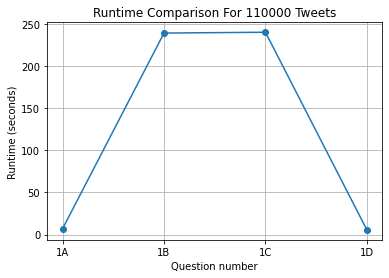

In [1]:
#FOR 110000 TWEETS
import matplotlib.pyplot as plt


ques_no = ['1A', '1B', '1C', '1D']
runtimes = [6.811869859695435, 238.99557852745056, 239.9575173854828, 5.265401363372803]  
plt.plot(ques_no, runtimes, marker='o')
plt.xlabel('Question number')
plt.ylabel('Runtime (seconds)')
plt.title('Runtime Comparison For 110000 Tweets')
plt.grid(True)
plt.show()

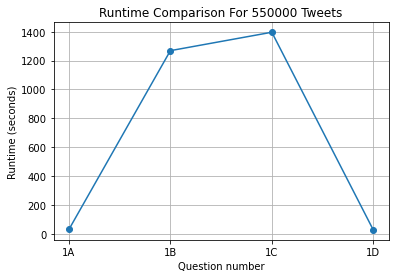

In [2]:
#FOR 550000 TWEETS
import matplotlib.pyplot as plt

ques_no = ['1A', '1B', '1C', '1D']
runtimes = [31.154720544815063, 1268.6021401882172, 1396.0232889652252, 26.93093490600586]

plt.plot(ques_no, runtimes, marker='o')
plt.xlabel('Question number')
plt.ylabel('Runtime (seconds)')
plt.title('Runtime Comparison For 550000 Tweets')
plt.grid(True)
plt.show()

In [7]:
#PART 2A
import sqlite3
import time
conn = sqlite3.connect('tweet_1C_110000.db')
cursor = conn.cursor()
start = time.time()
#We are referring to tweets using FK (logitude,latitude) for individual user_id
query = '''
    SELECT t.user_id, AVG(g.longitude) AS Longitude_Average, AVG(g.latitude) AS Latitude_Average
    FROM Tweets AS t
    JOIN Geo AS g ON t.longitude = g.longitude AND t.latitude = g.latitude
    GROUP BY t.user_id
'''
cursor.execute(query)
results = cursor.fetchall()
 
end = time.time()
query_runtime = end-start

print(f"Query runtime: {query_runtime} \n")
for row in results:
    user_id, Longitude_Average, Latitude_Average = row
    print(f"User ID: {user_id}, Average Longitude: {Longitude_Average}, Average Latitude: {Latitude_Average}")

conn.close()

Query runtime: 0.03486752510070801 

User ID: 7819, Average Longitude: 33.48155, Average Latitude: -112.073076
User ID: 5526282, Average Longitude: 55.857744, Average Latitude: 37.496704
User ID: 7519912, Average Longitude: 48.828888, Average Latitude: 2.355292
User ID: 8706722, Average Longitude: -22.978287, Average Latitude: -43.225287
User ID: 9412982, Average Longitude: 42.388394, Average Latitude: -83.332063
User ID: 10537182, Average Longitude: 35.701708, Average Latitude: 139.985218
User ID: 12186412, Average Longitude: 41.54169, Average Latitude: -81.45654
User ID: 13389022, Average Longitude: 43.423756, Average Latitude: -4.037291
User ID: 13394802, Average Longitude: 29.579436, Average Latitude: -95.5744
User ID: 14090660, Average Longitude: 12.827474, Average Latitude: 80.049429
User ID: 14230373, Average Longitude: 44.932629, Average Latitude: -93.163046
User ID: 14357084, Average Longitude: 42.684314, Average Latitude: -73.794787
User ID: 14665203, Average Longitude: 43.64

In [9]:
#PART 2B
import sqlite3
import time

conn = sqlite3.connect('tweet_1C_110000.db')
cursor = conn.cursor()
query = '''
    SELECT t.user_id, AVG(g.longitude) AS Longitude_Average, AVG(g.latitude) AS Latitude_Average
    FROM Tweets AS t
    JOIN Geo AS g ON t.longitude = g.longitude AND t.latitude = g.latitude
    GROUP BY t.user_id
'''

num_executions = [5, 20]
for n in num_executions:
    start = time.time()
    for _ in range(n):
        cursor.execute(query)
        results = cursor.fetchall()
    end = time.time()
    total_query_runtime = end - start
    print(f"Number of Executions: {n}, Total Runtime: {total_query_runtime} seconds")

conn.close()


Number of Executions: 5, Total Runtime: 0.16204547882080078 seconds
Number of Executions: 20, Total Runtime: 0.6523327827453613 seconds


In [11]:
#PART 2B for 550000 tweets
import sqlite3
import time

conn = sqlite3.connect('tweet_1C_550000.db')
cursor = conn.cursor()
query = '''
    SELECT t.user_id, AVG(g.longitude) AS Longitude_Average, AVG(g.latitude) AS Latitude_Average
    FROM Tweets AS t
    JOIN Geo AS g ON t.longitude = g.longitude AND t.latitude = g.latitude
    GROUP BY t.user_id
'''

num_executions = [5, 20]
for n in num_executions:
    start = time.time()
    for _ in range(n):
        cursor.execute(query)
        results = cursor.fetchall()
    end = time.time()
    total_query_runtime = end - start
    print(f"Number of Executions: {n}, Total Runtime: {total_query_runtime} seconds")

conn.close()

Number of Executions: 5, Total Runtime: 0.8528697490692139 seconds
Number of Executions: 20, Total Runtime: 3.386674642562866 seconds


In [14]:
#2c
import json
import time
file_path = "C:/Users/nachi/Desktop/Databases/Final_BD/tweets_550000.txt"

user_totals = {}
user_counts = {}
start = time.time()
with open(file_path, "r", encoding="utf-8") as file:
    for line in file:
        try:
 
            tweet = json.loads(line)
            user_id = tweet["user"]["id"]
            coordinates = tweet.get("coordinates")

            if coordinates is None:
                continue

            longitude = coordinates.get("coordinates")[0]
            latitude = coordinates.get("coordinates")[1]

            if user_id in user_totals:
                user_totals[user_id][0] += longitude
                user_totals[user_id][1] += latitude
                user_counts[user_id] += 1
            else:
                user_totals[user_id] = [longitude, latitude]
                user_counts[user_id] = 1

        except json.JSONDecodeError:
            continue

average_coordinates = {}
for user_id, totals in user_totals.items():
    count = user_counts[user_id]
    average_longitude = totals[0] / count
    average_latitude = totals[1] / count
    average_coordinates[user_id] = (average_longitude, average_latitude)
end = time.time()
query_runtime = end - start

print(f"Query Runtime: {query_runtime}")

for user_id, coordinates in average_coordinates.items():
    print(f"User ID: {user_id}, Average Longitude: {coordinates[0]}, Average Latitude: {coordinates[1]}")


Query Runtime: 19.590349197387695 

User ID: 160370249, Average Longitude: 121.043955, Average Latitude: 14.670275
User ID: 233079540, Average Longitude: 110.213471, Average Latitude: -7.351872
User ID: 146612119, Average Longitude: -122.222, Average Latitude: 47.8487
User ID: 348864517, Average Longitude: -77.159617, Average Latitude: 38.767654
User ID: 128825864, Average Longitude: 106.728999, Average Latitude: -6.149429
User ID: 254674397, Average Longitude: -1.505078, Average Latitude: 52.536283
User ID: 2328860924, Average Longitude: 127.698844, Average Latitude: 26.198516
User ID: 500289098, Average Longitude: -115.170286, Average Latitude: 36.109317
User ID: 1560357476, Average Longitude: -46.288466, Average Latitude: -23.953996
User ID: 1631720540, Average Longitude: -51.216072, Average Latitude: -29.188215
User ID: 610180858, Average Longitude: -77.359981, Average Latitude: 34.771422
User ID: 222471428, Average Longitude: -57.612373, Average Latitude: -25.299878
User ID: 21582

User ID: 2220883210, Average Longitude: -65.343375, Average Latitude: -36.476431
User ID: 820767828, Average Longitude: -122.266955, Average Latitude: 38.283556
User ID: 71236183, Average Longitude: -1.628276, Average Latitude: 54.980513
User ID: 1472579078, Average Longitude: -90.374768, Average Latitude: 38.485725
User ID: 989365214, Average Longitude: -83.191863, Average Latitude: 35.922764
User ID: 231568370, Average Longitude: -75.559186, Average Latitude: 6.330606
User ID: 251839614, Average Longitude: -75.156449, Average Latitude: 39.974386
User ID: 493571601, Average Longitude: -86.300418, Average Latitude: 36.180921
User ID: 245125370, Average Longitude: -61.282254, Average Latitude: -38.713002
User ID: 66755464, Average Longitude: -47.99344, Average Latitude: -15.82811
User ID: 162138862, Average Longitude: 7.47037, Average Latitude: 9.03056
User ID: 152745201, Average Longitude: -99.126349, Average Latitude: 19.348219
User ID: 438827254, Average Longitude: -46.655197, Averag

User ID: 520757555, Average Longitude: -43.419517, Average Latitude: -22.76898
User ID: 164664352, Average Longitude: 102.242174, Average Latitude: 2.712636
User ID: 271651868, Average Longitude: -94.078244, Average Latitude: 33.399445
User ID: 1330109264, Average Longitude: -0.12468, Average Latitude: 51.500753
User ID: 352787275, Average Longitude: -73.786985, Average Latitude: 40.676379
User ID: 1902440370, Average Longitude: -95.383978, Average Latitude: 29.532431
User ID: 1029501140, Average Longitude: -77.929857, Average Latitude: 34.388597
User ID: 1619289949, Average Longitude: -76.283183, Average Latitude: 36.831188
User ID: 489005227, Average Longitude: -83.406009, Average Latitude: 42.343061
User ID: 367572257, Average Longitude: -87.620156, Average Latitude: 41.663662
User ID: 93519495, Average Longitude: -47.45085, Average Latitude: -5.509636
User ID: 1497118410, Average Longitude: -64.014959, Average Latitude: -33.635639
User ID: 132616506, Average Longitude: -43.204303, 

In [17]:
#2D
import json
import time

def calc_average(file_path):
    start = time.time()
    user_totals = {}
    user_counts = {}

    with open(file_path, "r", encoding="utf-8") as file:
        for line in file:
            try:
               
                tweet = json.loads(line)
                user_id = tweet["user"]["id"]
                coordinates = tweet.get("coordinates")

                if coordinates is None:
                    continue

                longitude = coordinates.get("coordinates")[0]
                latitude = coordinates.get("coordinates")[1]

                if user_id in user_totals:
                    user_totals[user_id][0] += longitude
                    user_totals[user_id][1] += latitude
                    user_counts[user_id] += 1
                else:
                    user_totals[user_id] = [longitude, latitude]
                    user_counts[user_id] = 1

            except json.JSONDecodeError:
                continue

    average_coordinates = {}
    for user_id, totals in user_totals.items():
        count = user_counts[user_id]
        average_longitude = totals[0] / count
        average_latitude = totals[1] / count
        average_coordinates[user_id] = (average_longitude, average_latitude)

    end = time.time()
    query_runtime = end - start


        
    return query_runtime

file_path = "C:/Users/nachi/Desktop/Databases/Final_BD/tweets_550000.txt"
num_executions = [5, 20]

for executions in num_executions:
    total_runtime = 0
    for _ in range(executions):
        runtime = calc_average(file_path)
        total_runtime += runtime

    print(f"Number of Executions: {executions}, Total Runtime: {total_runtime} seconds")
    

Number of Executions: 5, Total Runtime: 97.33618330955505 seconds
Number of Executions: 20, Total Runtime: 391.07002782821655 seconds


In [1]:
#2E
import re
import time

user_totals = {}
user_counts = {}

filepath = 'C:/Users/nachi/Desktop/Databases/Final_BD/tweets_110000.txt'

start = time.time()
with open(filepath, 'r', encoding='utf-8') as f:
    for line in f:
        user_id_match = re.search(r'"user":{"id":(\d+)', line)
        geo_match = re.search(r'"geo":\{"type":"Point","coordinates":\[((?:-?\d+\.\d+),\s*(?:-?\d+\.\d+))\]', line)

        if user_id_match and geo_match:
            user_id = user_id_match.group(1)
            coordinates = geo_match.group(1)
            longitude, latitude = map(float, coordinates.split(','))

            if user_id in user_totals:
                user_totals[user_id][0] += longitude
                user_totals[user_id][1] += latitude
                user_counts[user_id] += 1
            else:
                user_totals[user_id] = [longitude, latitude]
                user_counts[user_id] = 1

average_coordinates = {}
for user_id, totals in user_totals.items():
    count = user_counts[user_id]
    average_longitude = totals[0] / count
    average_latitude = totals[1] / count
    average_coordinates[user_id] = (average_longitude, average_latitude)
end = time.time()
query_runtime = end - start
print(f"Query runtime: {query_runtime} \n")
for user_id, coordinates in average_coordinates.items():
    print(f"User ID: {user_id}, Average Longitude: {coordinates[0]}, Average Latitude: {coordinates[1]}")

Query runtime: 2.0304901599884033 

User ID: 160370249, Average Longitude: 14.670275, Average Latitude: 121.043955
User ID: 233079540, Average Longitude: -7.351872, Average Latitude: 110.213471
User ID: 146612119, Average Longitude: 47.8487, Average Latitude: -122.222
User ID: 348864517, Average Longitude: 38.767654, Average Latitude: -77.159617
User ID: 128825864, Average Longitude: -6.149429, Average Latitude: 106.728999
User ID: 254674397, Average Longitude: 52.536283, Average Latitude: -1.505078
User ID: 2328860924, Average Longitude: 26.198516, Average Latitude: 127.698844
User ID: 1022608538, Average Longitude: -29.716929, Average Latitude: -57.086503
User ID: 15610222, Average Longitude: 40.388261, Average Latitude: -75.273898
User ID: 500289098, Average Longitude: 36.109317, Average Latitude: -115.170286
User ID: 1560357476, Average Longitude: -23.953996, Average Latitude: -46.288466
User ID: 1631720540, Average Longitude: -29.188215, Average Latitude: -51.216072
User ID: 31089

In [2]:
#2F
import re
import time

def execute_query(filepath):
    user_totals = {}
    user_counts = {}

    with open(filepath, 'r', encoding='utf-8') as f:
        for line in f:
            user_id_match = re.search(r'"user":{"id":(\d+)', line)
            geo_match = re.search(r'"geo":\{"type":"Point","coordinates":\[((?:-?\d+\.\d+),\s*(?:-?\d+\.\d+))\]', line)

            if user_id_match and geo_match:
                user_id = user_id_match.group(1)
                coordinates = geo_match.group(1)
                longitude, latitude = map(float, coordinates.split(','))

                if user_id in user_totals:
                    user_totals[user_id][0] += longitude
                    user_totals[user_id][1] += latitude
                    user_counts[user_id] += 1
                else:
                    user_totals[user_id] = [longitude, latitude]
                    user_counts[user_id] = 1

    return user_totals, user_counts

def measure_runtime(executions, filepath):
    total_runtime = 0

    for _ in range(executions):
        start = time.time()
        user_totals, user_counts = execute_query(filepath)
        end = time.time()
        query_runtime = end - start
        total_runtime += query_runtime

    return total_runtime

filepath = 'C:/Users/nachi/Desktop/Databases/Final_BD/tweets_110000.txt'

runtime_5_executions = measure_runtime(5, filepath)
print(f"Total runtime for 5 executions: {runtime_5_executions} seconds")

runtime_20_executions = measure_runtime(20, filepath)
print(f"Total runtime for 20 executions: {runtime_20_executions} seconds")


Total runtime for 5 executions: 10.29964804649353 seconds
Total runtime for 20 executions: 40.46121311187744 seconds


In [5]:
#3A
import sqlite3
conn = sqlite3.connect("tweet_1C_550000.db")
cursor = conn.cursor()
query = '''
CREATE TABLE CombinedTables AS
SELECT Tweets.*, User.*, Geo.longitude, Geo.latitude
FROM Tweets
LEFT JOIN User ON Tweets.user_id = User.user_id
LEFT JOIN Geo ON Tweets.longitude = Geo.longitude AND Tweets.latitude = Geo.latitude;
'''

cursor.execute(query)
conn.commit()

query = "SELECT * FROM CombinedTables"
cursor.execute(query)
rows = cursor.fetchall()
for row in rows:
    print(row)
    
cursor.close()
conn.close()

('Thu May 29 00:00:43 +0000 2014', 471803285746495489, 'There is no wealth but life. ~John Ruskin #wisdomink', '<a href="http://www.hootsuite.com" rel="nofollow">HootSuite</a>', None, None, None, 0, None, 213646047, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:00:43 +0000 2014', 471803285738106880, 'Mucho la Plop esto, la Plop aquello, pero de los viernes es la fiesta con la gente más linda. \nEn las otras vienen directo de la frontera.', 'web', None, None, None, 0, None, 38950479, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:00:43 +0000 2014', 471803285767462913, 'motive. When a political idea finds its way into such heads,', '<a href="http://eto-secret4.ru" rel="nofollow">eto prosto NEW secret</a>', None, None, None, 0, None, 2443526930, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:00:43 +0000 2014', 471803285750681600, '@im_2realbih bol!', '<a href="http://twitter.com/download/android" rel="

('Thu May 29 00:01:57 +0000 2014', 471803596141371392, 'RT @nughinnn_: @_rmforshort_ pak lama tak jumpa hang', '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', None, None, None, 0, None, 715734067, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:01:57 +0000 2014', 471803596124614657, 'Talenta"@T3kaT3ki: A-N T-L-T-A--E #SusunKata "bakat""', '<a href="http://blackberry.com/twitter" rel="nofollow">Twitter for BlackBerry®</a>', None, None, None, 0, None, 2255617711, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:01:57 +0000 2014', 471803596137177088, 'RT @berykhorany: THEYRE LITERALLY MAKING NORTH CANYON A PRISON.', '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', None, None, None, 0, None, 1877155500, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:01:57 +0000 2014', 471803596128800768, "Salmon with raspberry preserves (Scotty's f

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




('Thu May 29 00:26:35 +0000 2014', 471809795302129665, 'RT @TobiasIasillo: #ChauDignidadCuando vas tirando facha y te tropezas...', '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', None, None, None, 0, None, 2186762914, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:26:35 +0000 2014', 471809795318886400, 'I still love your name 😏 @si3rra143', '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', None, None, None, 0, None, 1046264682, 41.120153, -112.063617, None, None, None, None, None, None, 41.120153, -112.063617)
('Thu May 29 00:26:35 +0000 2014', 471809795302105089, '@MarkPotash killjoy', '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 328613808, 'MarkPotash', 471808933904908300, 0, None, 213738134, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:26:35 +0000 2014', 471809795305910273, "Glad it's oveeeerrr", '<a href

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('Thu May 29 00:51:14 +0000 2014', 471815998690299904, 'RT @MattHill182: I want to talk to somebody new.', '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', None, None, None, 0, None, 212841146, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:51:14 +0000 2014', 471815998673125376, 'Frosted Cranberry Bath Caviar Beads New  http://t.co/PuHF9Fh5Nh', '<a href="http://tweetadder.com" rel="nofollow">TweetAdder v4</a>', None, None, None, 0, None, 1463821616, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:51:14 +0000 2014', 471815998681522176, '@Riuy303 これはもう私と莉胡ちんでWエースを補うしか…( ˇωˇ )', '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', 138965212, 'Riuy303', 471814119918559200, 0, None, 115903684, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:51:14 +0000 2014', 471815998685736961, '@xlkslbccdtks___ memang best! Tapi sekarang tengah sunyi 

('Thu May 29 00:52:44 +0000 2014', 471816376177680384, 'RT @MiNotaFemenina: "Admítelo: te gustaría recibir ahora un mensaje de la persona que menos te escribe..."', 'web', None, None, None, 0, None, 511158293, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:52:44 +0000 2014', 471816376177262592, 'RT @MRafliRmdhn: "@ashellanabila: Happyanniv @sarahalfatiha w/ @MF_Geoherka longlast yohhh;-p"', '<a href="http://www.echofon.com/" rel="nofollow">Echofon</a>', None, None, None, 0, None, 335127372, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:52:44 +0000 2014', 471816376194039808, '黄金のコインを120枚集めました！私よりたくさん集めららる人はいますか？ http://t.co/LqL6NSvleP #iphone, #iphonegames, #gameinsight', '<a href="https://itunes.apple.com/us/app/the-tribez/id511317727?mt=8&uo=4" rel="nofollow">The Tribez on iOS</a>', None, None, None, 0, None, 701137334, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 00:52:44 +0000 2014', 4718163761651

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('Thu May 29 01:14:46 +0000 2014', 471821921034981376, 'No te preocupes, yo también sé olvidar.', 'web', None, None, None, 0, None, 2230457732, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:14:46 +0000 2014', 471821921030795265, 'So  foi eu flr q começou o k.o', 'web', None, None, None, 0, None, 318082112, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:14:46 +0000 2014', 471821921055932416, 'المتواجدين حاليين ✔عل طووول ابدأ الان والله \ue21fقوربات مشاركه ✔ ١- ضيفني ✔ ٢- رتويت ✔ ٣- ضيف من قام بالرتويت ✔ ٤- الفولوباك ✔ ٥-الإلتزام ضروري', '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', None, None, None, 0, None, 2531233200, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:14:46 +0000 2014', 471821921060130817, 'no, sos feo', 'web', None, None, None, 0, None, 555255018, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:14:46 +0000 2014', 47

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




('Thu May 29 01:37:44 +0000 2014', 471827700798464000, "No Charter! It's your crappy equipment/service.", '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', None, None, None, 0, None, 18466429, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:37:44 +0000 2014', 471827700781707264, "@ratchetN3SS lol what? Can't see which one you replied to", '<a href="http://getfalcon.pro" rel="nofollow">Falcon Pro</a>', 237097836, 'ratchetN3SS', 471826642302955500, 0, None, 164917071, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:37:44 +0000 2014', 471827700785872896, '@cuspidasjb que? vou fazer 14 ainda zz', 'web', 2424441055, 'cuspidasjb', 471827374821343200, 0, None, 1952305538, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:37:44 +0000 2014', 471827700811051008, '@_ZaneDuncan31 YES BRO PLEASE', '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('Thu May 29 01:59:42 +0000 2014', 471833228891156481, '@mayrarehbein buenos pelos e', '<a href="https://mobile.twitter.com" rel="nofollow">Mobile Web (M2)</a>', 166362994, 'MayraRehbein', 471832939655737340, 0, None, 933287342, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:59:42 +0000 2014', 471833228874350592, '@Brayanhvasquez No juegue con eso! Jajaja tu sabes que te quedaste dormido.', '<a href="http://blackberry.com/twitter" rel="nofollow">Twitter for BlackBerry®</a>', 593054477, 'Brayanhvasquez', 471832777042972700, 0, None, 572966638, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:59:42 +0000 2014', 471833228894928896, 'テンテレテンテケテケテーーン♪', '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', None, None, None, 0, None, 2321809201, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 01:59:42 +0000 2014', 471833228891131904, 'RT @Mikethooo: @VilleCertified_ iight boi I got

('Thu May 29 02:00:52 +0000 2014', 471833522500427776, 'RT @mens_hairstyle_: スタイリッシュショート http://t.co/yNG2oA7Mpb', '<a href="https://twitter.com/line_de_www" rel="nofollow">followboost for iOS</a>', None, None, None, 0, None, 2201537046, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:00:52 +0000 2014', 471833522492014593, 'RT @RELATlONSHlP: true http://t.co/FYzVg4pNcB', 'web', None, None, None, 0, None, 1494758712, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:00:52 +0000 2014', 471833522483625984, 'RT @BrendanFAS: #farawaystables are at #bondi beach this weekend!\n31/05/14 http://t.co/1LDKnBKISB', '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', None, None, None, 0, None, 290883931, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:00:52 +0000 2014', 471833522483634176, 'RT @will_WILDfire: SPENT 30 MINS LOOKING THRU THE TRASH FOR THIS PACKET 2 PROVE TO MY GIRL THE C

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




('Thu May 29 02:22:05 +0000 2014', 471838861828435969, 'RT @DJ10064121: 【太らない食生活ポイント】\n\n野菜中心食生活\n\n水分補給\n\nサラダやスープで食べ始める\n\n白パンでなく全粒粉\n\n食事中テレビを消す\n\n外食前フルーツを摂る\n\n人工甘味料を使わない\n\n満腹感ではなく満足感を得る\n\n朝食を摂る http://t.co…', '<a href="https://twitter.com/harumvp99_2012" rel="nofollow">エンジョウドウ</a>', None, None, None, 0, None, 980382301, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:22:05 +0000 2014', 471838861836832769, 'RT @asahi_school: ぷ）公立高校入試の採点ミスがなくなりません。教員が空き時間にこなすやり方では、どれだけ対策を打ってもミスはゼロにならないでしょう。かといって外部委託できる予算もない。このままでは入試の公平性が疑われかねません。名案はないでしょうか。http:…', 'web', None, None, None, 0, None, 113877166, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:22:05 +0000 2014', 471838861820063745, 'http://t.co/tBQNE8d1lA', '<a href="http://blackberry.com/twitter" rel="nofollow">Twitter for BlackBerry®</a>', None, None, None, 0, None, 174331331, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:22:05 +0000 2014', 47183

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('Thu May 29 02:43:13 +0000 2014', 471844180231061506, 'http://t.co/MQDbZ0l7JJ', '<a href="http://www.facebook.com/twitter" rel="nofollow">Facebook</a>', None, None, None, 0, None, 432237915, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:43:13 +0000 2014', 471844180231073792, '😳 http://t.co/g6wbaS79gp', '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', None, None, None, 0, None, 1626067142, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:43:14 +0000 2014', 471844184396427265, 'uhhhh', '<a href="https://mobile.twitter.com" rel="nofollow">Mobile Web (M2)</a>', None, None, None, 0, None, 632926443, None, None, None, None, None, None, None, None, None, None)
('Thu May 29 02:43:14 +0000 2014', 471844184400601088, 'Vou dormir com Mel .. Bjos', '<a href="https://twitter.com/download/android" rel="nofollow">Twitter for  Android</a>', None, None, None, 0, None, 1375646587, None, None, None, None, None,

In [2]:
#3B
import sqlite3
import json
conn = sqlite3.connect('tweet_1C_550000.db')
cursor = conn.cursor()

tweet_query = 'SELECT * FROM Tweets'
cursor.execute(tweet_query)
tweet_rows = cursor.fetchall()
tweet_data = []
for row in tweet_rows:
    tweet = {
        'created_at': row[0],
        'id_str': row[1],
        'text': row[2],
        'source': row[3],
        'in_reply_to_user_id': row[4],
        'in_reply_to_screen_name': row[5],
        'in_reply_to_status_id': row[6],
        'retweet_count': row[7],
        'contributors': row[8],
        'user_id': row[9],
        'longitude': row[10],
        'latitude': row[11]
    }
    tweet_data.append(tweet)

combined_query = 'SELECT * FROM CombinedTables'
cursor.execute(combined_query)
combined_rows = cursor.fetchall()
combined_data = []
for row in combined_rows:
    combined_entry = {
        'user_id': row[0],
        'id': row[1],
        'name': row[2],
        'screen_name': row[3],
        'description': row[4],
        'friends_count': row[5],
        'created_at': row[6],
        'id_str': row[7],
        'text': row[8],
        'source': row[9],
        'in_reply_to_user_id': row[10],
        'in_reply_to_screen_name': row[11],
        'in_reply_to_status_id': row[12],
        'retweet_count': row[13],
        'contributors': row[14],
        'longitude': row[15],
        'latitude': row[16]
    }
    combined_data.append(combined_entry)

with open('tweets.json', 'w') as tweetData_file:
    json.dump(tweet_data, tweetData_file)
with open('combined_data.json', 'w') as combinedData_file:
    json.dump(combined_data, combinedData_file)

conn.close()


In [3]:
#3C
import sqlite3
import csv

conn = sqlite3.connect('tweet_1C_550000.db')
cursor = conn.cursor()

tweet_query = 'SELECT * FROM Tweets'
cursor.execute(tweet_query)
tweet_rows = cursor.fetchall()

with open('tweets_csv_file.csv', 'w', newline='', encoding='utf-8') as tweet_file:
    tweet_writer = csv.writer(tweet_file)
    tweet_writer.writerow(['created_at', 'id_str', 'text', 'source', 'in_reply_to_user_id',
                           'in_reply_to_screen_name', 'in_reply_to_status_id', 'retweet_count',
                           'contributors', 'user_id', 'longitude', 'latitude'])
    tweet_writer.writerows(tweet_rows)

combined_query = 'SELECT * FROM CombinedTables'
cursor.execute(combined_query)
combined_rows = cursor.fetchall()

with open('combined_csv_data.csv', 'w', newline='', encoding='utf-8') as combined_file:
    combined_writer = csv.writer(combined_file)
    combined_writer.writerow(['user_id', 'id', 'name', 'screen_name', 'description',
                              'friends_count', 'created_at', 'id_str', 'text', 'source',
                              'in_reply_to_user_id', 'in_reply_to_screen_name',
                              'in_reply_to_status_id', 'retweet_count', 'contributors',
                              'longitude', 'latitude'])
    combined_writer.writerows(combined_rows)

conn.close()
